In [1]:
import numpy as np
import pandas as pd
from scipy import stats
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('marketing_campaign.csv',sep='\t')

In [3]:
s_df = df.sample(n=100,random_state = 100)

# ANOVA Test :
#ANOVA examines the difference among groups by calculating the ratio of variance across different groups vs variance within a group. Larger ratio indicates that the difference across groups is a result of the group difference rather than just random chance.

#I use the feature “Kidhome” for the prediction of “NumWebPurchases”. There are three values of “Kidhome” - 0, 1, 2 which naturally forms three groups.

In [4]:
s_df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [5]:
kidhome_0 = s_df[s_df['Kidhome']==0]['NumWebPurchases']
kidhome_1 = s_df[s_df['Kidhome']==1]['NumWebPurchases']
kidhome_2 = s_df[s_df['Kidhome']==2]['NumWebPurchases']

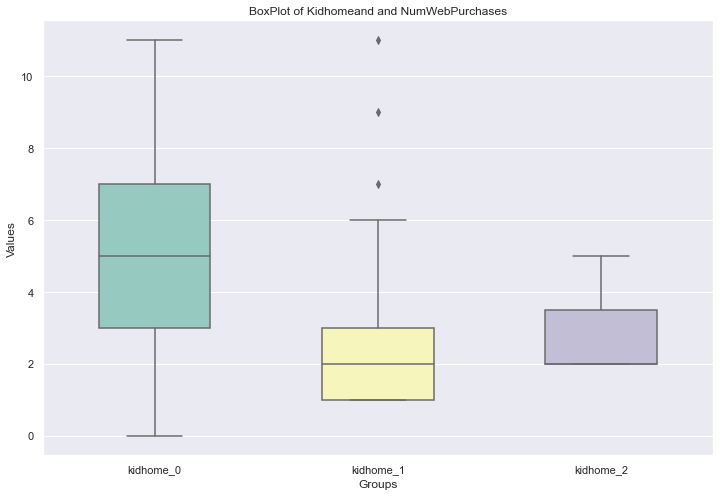

In [6]:
# Using matplotlib and seaborn

# Combine the data into a list
data = [kidhome_0,kidhome_1,kidhome_2]

plt.figure(figsize = (12,8))
sns.set(style="darkgrid")

sns.boxplot(data=data, width=0.5, palette = 'Set3')

plt.xticks([0,1,2],['kidhome_0','kidhome_1','kidhome_2'])
plt.xlabel('Groups')
plt.ylabel('Values')
plt.title('BoxPlot of Kidhomeand and NumWebPurchases')

plt.show()

In [7]:
# Using plotly graphs

# Create a figure with multiple box plots
fig = go.Figure()

In [8]:
# Add box plots for each group
fig.add_trace(go.Box(y=kidhome_0, name='Kidhome_0'))
fig.add_trace(go.Box(y=kidhome_1, name='Kidhome_1'))
fig.add_trace(go.Box(y=kidhome_2, name='Kidhome_2'))

# Customize the layout (optional)
fig.update_layout(
    title="Multiple Box Plots",
    yaxis_title="Values",
    
)

fig.show()

#It appears there are distinct differences among three groups. So let’s carry out ANOVA test to prove if that’s the case.

# define hypothesis
1) Null hypothesis : There is no difference between three groups
2) Alternative hypothesis : There is difference between two group

ANOVA test for examining the relationships of numeric values against a categorical value with more than two groups. Similar to t-test, the null hypothesis of ANOVA test also follows a distribution defined by degrees of freedom. The degrees of freedom in ANOVA is determined by number of total samples (n) and the number of groups (k).

In [9]:
# degree of freedom for within group variance
n=100
k=3
dfn = k-1

# degree of freedom for between group variance

dfd = n-k

In [10]:
#perform oneway anova

f_stat, p_value = stats.f_oneway(kidhome_0,kidhome_1,kidhome_2)

In [11]:
f_stat, p_value

(8.496139598178, 0.00039808004666969554)

In [12]:
rv = stats.f(dfn,dfd)

In [13]:
x = np.linspace(rv.ppf(0.0001),rv.ppf(0.9999),100000)
y = rv.pdf(x)

In [14]:
# Calculate the critical value for the significance level
alpha = 0.05
f_critical = stats.f.ppf(1 - alpha, dfn, dfd)

In [15]:
fig1= go.Figure()

In [16]:
fig1.add_trace(go.Scatter(x=x,y=y, mode='lines', name='f_distribution'))

fig1.update_xaxes(title='f_statistics')
fig1.update_yaxes(title= ' Probability Density')
# Significan level 
fig1.add_shape(
    type='line',
    x0=f_critical,
    x1=f_critical,
    y0=0,
    y1=max(y),
    line=dict(color='green', width=2),
    name='Test Statistic'
)
# Add a vertical line at the test statistic
fig1.add_shape(
    type='line',
    x0=f_stat,
    x1=f_stat,
    y0=0,
    y1=max(y),
    line=dict(color='brown', width=2),
    name='Test Statistic'
)
fig1.add_annotation(
    text=f'f_statistic: {f_stat:.4f}',
    x=f_stat, y=max(y) * 0.8, showarrow=True,
    arrowhead=2, ax=0, ay=-20, arrowwidth=2
)

fig1.add_annotation(
    text=f'Significance level: {0.05}',
     x=f_critical, y=max(y) * 0.8, showarrow=True,
    arrowhead=2, ax=0, ay=-20, arrowwidth=2
)
fig1.show()

# the statistical significance: Compare the p-value against the significance level 0.05, we can infer that there is strong evidence against the null hypothesis and very likely that there is difference in “NumWebPurchases” between at least two groups.